# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---

## Step 1: Dataset Exploration

Visualize the German Traffic Signs Dataset. This is open ended, some suggestions include: plotting traffic signs images, plotting the count of each sign, etc. Be creative!


The pickled data is a dictionary with 4 key/value pairs:

- features -> the images pixel values, (width, height, channels)
- labels -> the label of the traffic sign
- sizes -> the original width and height of the image, (width, height)
- coords -> coordinates of a bounding box around the sign in the image, (x1, y1, x2, y2). Based the original image (not the resized version).

In [56]:
# Load pickled data
import pickle

# TODO: fill this in based on where you saved the training and testing data
training_file = './train.p'
testing_file = './test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)


X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [57]:
### To start off let's do a basic data summary.

# number of training examples
n_train = len(X_train)

# number of testing examples
n_test = len(X_test)

# what's the shape of an image?
image_shape = X_train[0].shape

# how many classes are in the dataset
n_classes = len(set(y_train))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


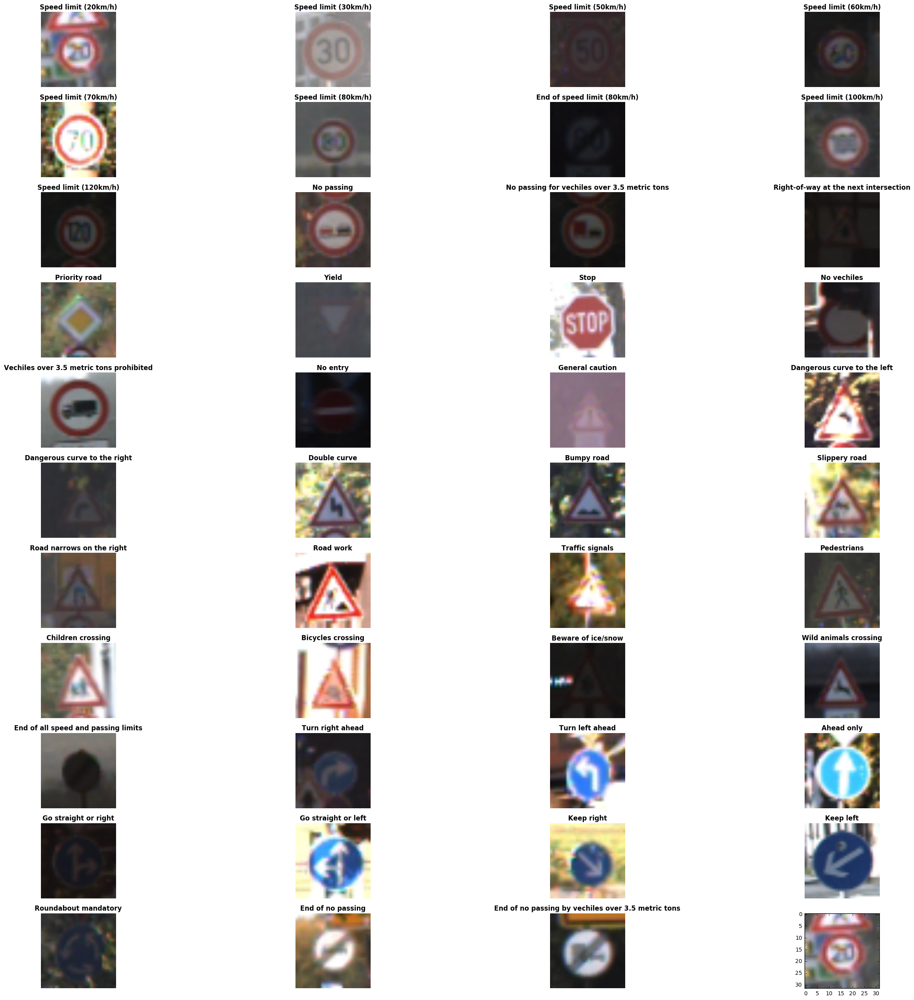

In [58]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.

import matplotlib.pyplot as plt
import numpy as np
import random
import csv

%matplotlib inline

# read sign names into dictionary to display alongside the sample image of each class
with open('signnames.csv', 'r') as csvfile:
    reader = csv.reader(csvfile)
    next(reader, None)  # skip the headers
    sign_names = dict((int(n), label) for n, label in reader)


# display an exapmple of each class in a 4 x 11 grid
def show_image_grid():
    _, ax = plt.subplots(11, 4, figsize=(32,32))
    row_counter = 0
    for class_id, sign_name in sign_names.items():
        idx = np.where(y_train == class_id)[0][np.random.randint(0, 10)]

        if class_id % 4 == 0 and class_id > 0:
            row_counter += 1

        ax[row_counter, class_id % 4].imshow(X_train[idx])
        ax[row_counter, class_id % 4].set_title(sign_name, fontdict={'fontweight': 'bold'})
        # don't show grid and axis.
        ax[row_counter, class_id % 4].grid(False)
        ax[row_counter, class_id % 4].axis('off')

    # fill the last remaining spot with the first image.
    ax[row_counter, 3].imshow(X_train[0])
    plt.show()

show_image_grid()

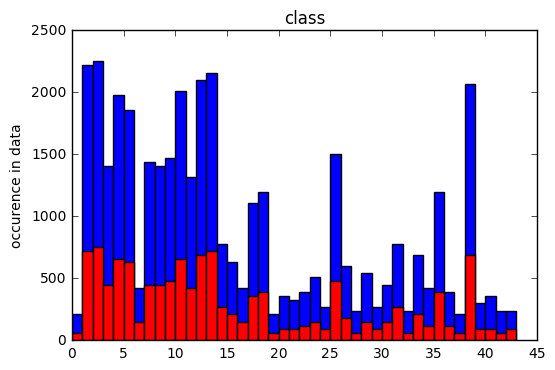

In [59]:
# count the occurence of each class
def count_class_occurence(labels):
    counts = []
    for i in range(n_classes):
        count = len(labels[labels == i])
        counts.append(count)
    return counts

train_classes = count_class_occurence(y_train)
test_classes = count_class_occurence(y_test)

# show the occurences of test and train labels in bar chart.
ind = np.arange(n_classes)
fig, ax = plt.subplots()
rects1 = ax.bar(ind, train_classes, 1, color='b')
rects2 = ax.bar(ind, test_classes, 1, color='r')
ax.set_ylabel('occurence in data')
ax.set_title('class')

plt.show()

Both test and training data have a widely different number of examples per class, though both seem to follow the same distribution per class.

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Your model can be derived from a deep feedforward net or a deep convolutional network.
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Question 1 

There's three steps I chose for preprocessing:
1. the region of interest (i.e. the sign itself) for most images lies in the center of the given image. Thus on each side 4px are cut off to dispose of the noise around.
2. the images are normalized to have values between 0.01 and 0.99 as has been done in the training exercises before.
3. histogram equalization is applied to increase contrast across the image which might help picking up edges etc easier.

In [60]:
from tensorflow.contrib.learn.python.learn.datasets.mnist import dense_to_one_hot
from sklearn.cross_validation import train_test_split
import cv2

# apply some transformations to reduce noise.

# do histogram equalization with an image.
def apply_histogram_equalization(image):
    image_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)

    # equalize the histogram of the Y channel
    image_yuv[:,:,0] = cv2.equalizeHist(image_yuv[:,:,0])

    # convert the YUV image back to RGB format
    image_output = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2BGR)
    return image_output

def normalize(image):
    a = 0.01
    b = 0.99
    color_min = 0.0
    color_max = 255.0
    
    return a + (((image - color_min) * (b - a)) / (color_max - color_min))


# focus mostly on the center of the image where the actual sign is.
def crop_image(image, y1=4, y2=28, x1=4, x2=28):
    return image[y1:y2, x1:x2]


**Answer:**

In [61]:
### Generate data additional (if you want to!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

# split into train and validation
# randomize split of validation and training
def read_and_prepare_data_sets(validation_size, random_state=42, train_test=True):
    
    X_train, y_train = train['features'], dense_to_one_hot(train['labels'], n_classes)
    X_train = [crop_image(x) for x in X_train]
    X_train = [apply_histogram_equalization(x) for x in X_train]
    X_train = [normalize(x) for x in X_train]

    X_test, y_test = test['features'], dense_to_one_hot(test['labels'], n_classes)
    X_test = [crop_image(x) for x in X_test]
    X_test = [apply_histogram_equalization(x) for x in X_test]
    X_test = [normalize(x) for x in X_test]

    if not 0 <= validation_size <= len(X_train):
        raise ValueError(
            'Validation size should be between 0 and {}. Received: {}.'
            .format(len(X_train), validation_size))

    # use scikit to get random train/validation split
    if train_test:
        t_images, v_images, t_labels, v_labels = train_test_split(
            X_train, 
            y_train, 
            test_size=validation_size, 
            random_state=random_state
        )
    else:
        s = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=random_state)
        for train_index, test_index in s.split(X_train, y_train):
            print("TRAIN:", train_index, "TEST:", test_index)
            t_images, v_images = X_train[train_index], X_train[test_index]
            t_labels, v_labels = y_train[train_index], y_train[test_index]
    
    return t_images, t_labels, v_images, v_labels, X_test, y_test


### Question 2

_Describe how you set up the training, validation and testing data for your model. If you generated additional data, why?_

**Answer:**
scikit learn provides convenient helper methods for train test split. from the training set, I set a percentage aside to act as the validation set used to check the performance of the trained classifier before using the actual test set.

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

epoch 0: train accuracy = 0.72667 | validation accuracy = 0.76409 | (67.961 sec)
epoch 5: train accuracy = 0.96444 | validation accuracy = 0.95894 | (67.850 sec)
epoch 10: train accuracy = 0.99333 | validation accuracy = 0.97016 | (81.091 sec)
epoch 15: train accuracy = 0.98000 | validation accuracy = 0.97475 | (75.148 sec)
epoch 20: train accuracy = 0.98667 | validation accuracy = 0.97501 | (70.085 sec)


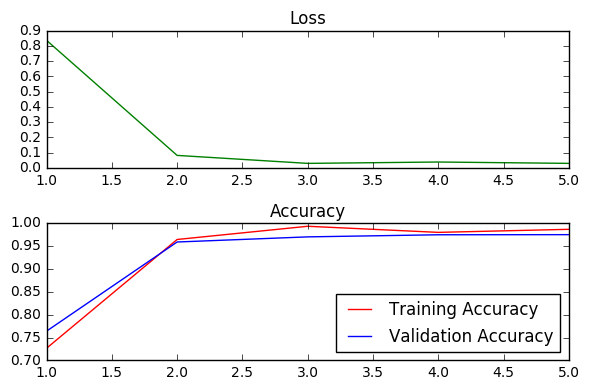

validation accuracy at 0.9750064015388489


In [62]:
### Train your model here.
### Feel free to use as many code cells as needed.

### Define your architecture here.
### Feel free to use as many code cells as needed.
import tensorflow as tf
import time

# name of the model to be trained
model = "model-traffic-final-20.ckpt"

# some hyper parameters
training_epochs = 21
learning_rate = 0.005
batch_size = 450
drop_out = 0.9

# placeholders for input
x = tf.placeholder(tf.float32, shape=[None, 24, 24, 3])
y = tf.placeholder(tf.float32, shape=[None, n_classes])
keep_prob = tf.placeholder(tf.float32)

# the data
tr_images, tr_labels, v_images, v_labels, t_images, t_labels = read_and_prepare_data_sets(0.10, random_state=45, train_test=True)

# first defining some functions to return elements of the conv net built below.
def weight_variable(shape):
    var = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(var)

def bias_varibale(shape):
    constant = tf.constant(0.1, shape=shape)
    return tf.Variable(constant)

def conv_2d(x, W):
    return tf.nn.conv2d(x, W, strides=[1, 1, 1, 1], padding='SAME')

def max_pool_2x2(x):
    return tf.nn.max_pool(x, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

# then building the network.

# first convolution layer, input is expected to have the form of 24 x 24 x 3
w_conv1 = weight_variable([7, 7, 3, 16])
b_conv1 = bias_varibale([16])
h_conv1 = tf.nn.relu(conv_2d(x, w_conv1) + b_conv1)
h_pool1 = max_pool_2x2(h_conv1)

# second convolutional layer with input of form 12 x 12 x 16
w_conv2 = weight_variable([5, 5, 16, 32])
b_conv2 = bias_varibale([32])
h_conv2 = tf.nn.relu(conv_2d(h_pool1, w_conv2) + b_conv2)
h_pool2 = max_pool_2x2(h_conv2)

# third convolutional layer with input of form 6 x 6 x 32
w_conv3 = weight_variable([3, 3, 32, 64])
b_conv3 = bias_varibale([64])
h_conv3 = tf.nn.relu(conv_2d(h_pool2, w_conv3) + b_conv3)
h_pool3 = max_pool_2x2(h_conv3)

# dense layer with input of form 3 x 3 x 64
w_fc1 = weight_variable([3 * 3 * 64, 128])
b_fc1 = bias_varibale([128])
h_pool3_flat = tf.reshape(h_pool3, [-1, 3 * 3 * 64])
h_fc1 = tf.nn.relu(tf.matmul(h_pool3_flat, w_fc1) + b_fc1)

# dense layer with input of form 1 x 128
w_fc2 = weight_variable([128, 256])
b_fc2 = bias_varibale([256])
h_fc2 = tf.nn.relu(tf.matmul(h_fc1, w_fc2) + b_fc2)

# dropout input of form 1 x 256
h_fc2_drop = tf.nn.dropout(h_fc2, keep_prob)

# readout layer
w_fc4 = weight_variable([256, n_classes])
b_fc4 = bias_varibale([n_classes])
logits = tf.matmul(h_fc2_drop, w_fc4) + b_fc4
probabilities = tf.nn.softmax(logits)

cross_entropy_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits, y))
# using the adam optimizer performed better than gradient descent.
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cross_entropy_loss)

# accuracy measurement
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(y, 1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


# Feed dicts for training and validation
train_feed_dict = {x: tr_images, y: tr_labels, keep_prob: drop_out}
validation_feed_dict = {x: v_images, y: v_labels, keep_prob: 1.0}

# Initializing the variables
init = tf.initialize_all_variables()

batches = []
loss_batch = []
train_acc_batch = []
valid_acc_batch = []


# Launch the graph
with tf.Session() as sess:
    
    # Add a Saver to save model checkpoint.
    saver = tf.train.Saver()
    
    sess.run(init)
    # Training cycle
    for epoch in range(training_epochs):
        start_time = time.time()
        total_batch = int(len(tr_images) / batch_size)
        # Loop over all batches
        for i in range(total_batch):
            start = i * batch_size
            end = (i + 1) * batch_size
            batch_x, batch_y = tr_images[start:end], tr_labels[start:end]
            feed_dict = {x: batch_x, y: batch_y, keep_prob: 0.95}
            _, loss, acc = sess.run([optimizer, cross_entropy_loss, accuracy], feed_dict=feed_dict)

        duration = time.time() - start_time
        if epoch % 5 == 0:
            # Check accuracy against Validation data
            validation_accuracy = sess.run(accuracy, feed_dict=validation_feed_dict)
            print("epoch %d: train accuracy = %.5f | validation accuracy = %.5f | (%.3f sec)" % (epoch, acc, validation_accuracy, duration))
            # Log batches
            previous_batch = batches[-1] if batches else 0
            batches.append(1 + previous_batch)
            loss_batch.append(loss)
            train_acc_batch.append(acc)
            valid_acc_batch.append(validation_accuracy)


    # save the model
    saver.save(sess, model)

loss_plot = plt.subplot(211)
loss_plot.set_title('Loss')
loss_plot.plot(batches, loss_batch, 'g')
loss_plot.set_xlim([batches[0], batches[-1]])
acc_plot = plt.subplot(212)
acc_plot.set_title('Accuracy')
acc_plot.plot(batches, train_acc_batch, 'r', label='Training Accuracy')
acc_plot.plot(batches, valid_acc_batch, 'b', label='Validation Accuracy')
acc_plot.legend(loc=4)
plt.tight_layout()
plt.show()
print('validation accuracy at {}'.format(validation_accuracy))


In [63]:
# run against the test set.
test_feed_dict = {x: t_images, y: t_labels, keep_prob: 1.0}

# Evaluate accuracy on test dataset
saver = tf.train.Saver()
with tf.Session() as sess:
    saver.restore(sess, model)
    test_accuracy = sess.run([accuracy], feed_dict=test_feed_dict)[0]
    print('test accuracy: %f' % test_accuracy)

test accuracy: 0.916865


**Architecture**

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

- optimizer: AdamOptimizer
- batch size: 450
- epochs: 21
- learning rate: 0.005
- drop out: 0.955

Initially, I started out with a larger batch size and greater number of epochs. Running several iterations and looking at the accuracy and loss graph, it became apparent that more epochs / iterations did not necessarily yield greater accuracy on the validation set, thus I reduced the number of epochs to the given level. 

Regarding the batch size I tried bigger and smaller values, but for bigger values, ther performance deteriorated and for smaller values the training time did increase significantly without yielding better results. 

The learning rate was taken from the labs, the decision to use the AdamOptimizer was based on the descriptions found in the docs.

### Question 5


_What approach did you take in coming up with a solution to this problem?_

**Answer:**

the approach was inspired by two papers, firstly the one mentioned in the exercise introduction and secondly a paper from 2012 with the title Multi-Column Deep Neural Network for Traffic Sign Classification ([link](Multi-Column Deep Neural Network for Traffic Sign
Classification)).

The multi layered architecture combining convolutions and max pooling was taken from there. 

In detail:
The architecture of the network progressively transforms the input from a representation that is \"wide and shallow\" (e.g. input is 24 x 24 x 3 which is wide/large in height and width but shallow in depth) to a representation that is \"narrow and deep\" (e.g. greater depth than height/width). Each additional depth dimension is a learned feature map that helps the network solve the classification task.

The architecture contains three convolutional layers followed by two fully-connected layers. Each convolutional layer employs a ReLU activation function and 2x2 max-pooling with a stride of 2 in each dimension. 
During training, the second fully-connected layer feeds a dropout layer wwhich in turn feeds the model's output layer.

Going from wide and shallow to narrow and deep, the number of feature maps doubles between each layer of the model as the dimensions are halved by the max pooling layers. 
It starts with 12 x 12 x 16 feature map at the output of the first convolutional layer, followed by a 6 x 6 x 32 and  finally a 3 x 3 x 64 as the output of the third layer. The same pattern applies to the fully connected layers.

The filters employed by the convolutional layers are also progressively shrunk to accomodate the halving of the spatial dimensions between model layers.

All of this was inspired by the paper mentioned above. 

Before using this solution, I tried a single and a two layer network without max pooling which performed considerably worse. 

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

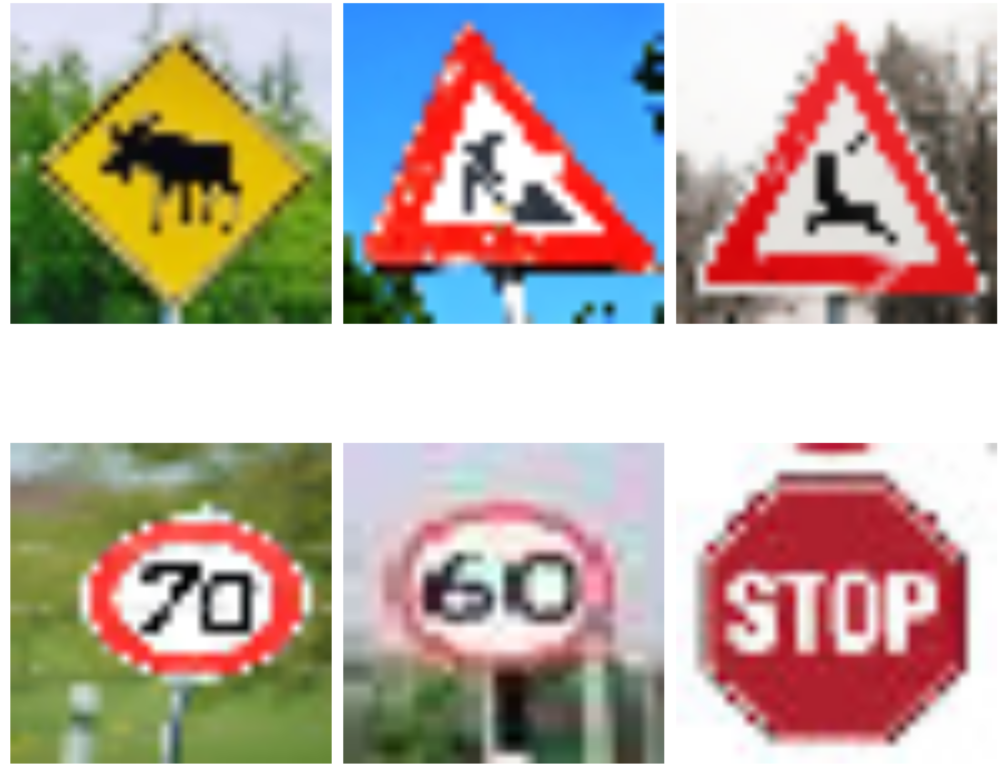

In [64]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

import matplotlib.image as mpimg
from PIL import Image

test_images_names = ['deer.png', 'construction.png', 'animals.png',
                     'speed-limit-70.png', 'speed-limit-60.png', 'stop.png']
test_images = []
_, ax = plt.subplots(2, 3, figsize=(32,32))
row_counter = 0
for i, image_path in enumerate(test_images_names):
    img = Image.open('new-images/' + image_path) # load image
    rsize = img.resize((32, 32)) # resize image to fit input data
    rsizeArr = np.asarray(rsize)
    test_images.append(rsizeArr) # save for later use
    if i % 3 == 0 and i > 0:
        row_counter += 1

    ax[row_counter, i % 3].imshow(rsizeArr)
    ax[row_counter, i % 3].grid(False)
    ax[row_counter, i % 3].axis('off')

plt.tight_layout()


### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It would be helpful to plot the images in the notebook._



**Answer:**

I chose one unknown sign which the classifier will have no chance to get right as it has not been learned. The rest of the images are known, most of them should not pose problems. 

The 60km/h speed limit sign has a rather opaque red which might make it difficult to predict.

In [65]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

# apply the same processing as for the training images.

test_images = [crop_image(x) for x in test_images]
#test_images = [apply_histogram_equalization(x) for x in test_images] some value error.
test_images = [normalize(x) for x in test_images]

TopKV2(values=array([[  9.85861897e-01,   2.64694588e-03,   2.33247015e-03,
          2.31161993e-03,   2.24925089e-03],
       [  9.99997616e-01,   2.43354089e-06,   1.74183068e-08,
          9.09799702e-09,   6.31594510e-09],
       [  7.14934766e-01,   2.85064578e-01,   4.05843281e-07,
          1.27362483e-07,   5.63938976e-08],
       [  9.99992013e-01,   6.27697227e-06,   1.04216394e-06,
          5.53078053e-07,   1.30191875e-08],
       [  8.38551283e-01,   1.34052977e-01,   9.70138330e-03,
          8.00622907e-03,   3.31554771e-03],
       [  9.99998450e-01,   1.19617141e-06,   1.83377253e-07,
          6.96772062e-08,   3.99908906e-08]], dtype=float32), indices=array([[23,  9, 31, 19, 20],
       [25, 29, 36, 30,  5],
       [31, 21, 29,  1, 23],
       [ 0,  1,  4, 20, 23],
       [23,  9, 19, 20, 10],
       [14, 15, 38, 13,  3]], dtype=int32))


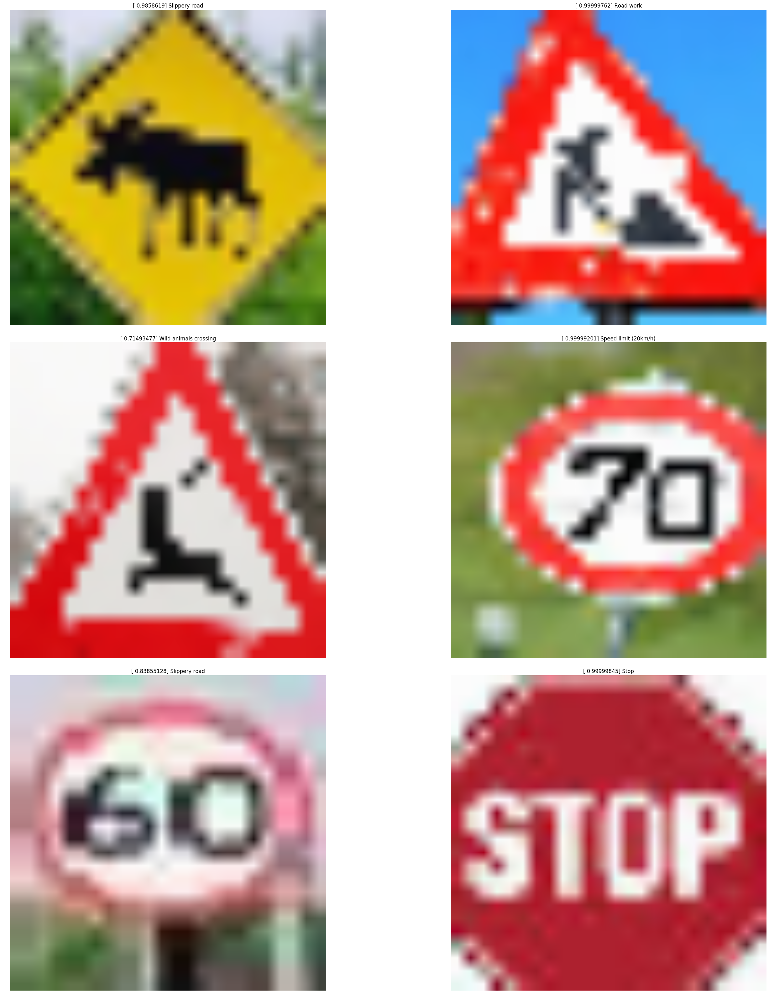

In [66]:
# helper function to extract label and probability from top_k output

def get_probability_and_label(top_k, index):
    score = top_k[0][index].ravel()[:1]
    label_int = top_k[1][index].ravel()[:1]
    label_str = sign_names[label_int[0]]
    
    return (score, label_str)

# classify the images
feed_dict_web = {x: test_images, keep_prob: 1.0}
top_k_scores = tf.nn.top_k(probabilities, k=5)

saver = tf.train.Saver()
with tf.Session() as sess:
    saver.restore(sess, model)
    logits_scores, top_k = sess.run([logits, top_k_scores], feed_dict=feed_dict_web)
    
print(top_k)
_, ax = plt.subplots(3, 2, figsize=(32,32))
row_counter = 0
for i, image in enumerate(test_images):
    if i % 2 == 0 and i > 0:
        row_counter += 1
    ax[row_counter, i % 2].imshow(image)
    ax[row_counter, i % 2].grid(False)
    score, label = get_probability_and_label(top_k, i)
    
    ax[row_counter, i % 2].set_title('%s' % score + ' ' + label)
    ax[row_counter, i % 2].axis('off')
plt.tight_layout()


### Question 7

_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the dataset?_


**Answer:**

My model classifies three out of five known signs correctly. For one of the incorrectly classified signs the prediction is still a speed limit sign, but not the right amount. 

In short, the model does not perform as well as suggested by the test set performance.

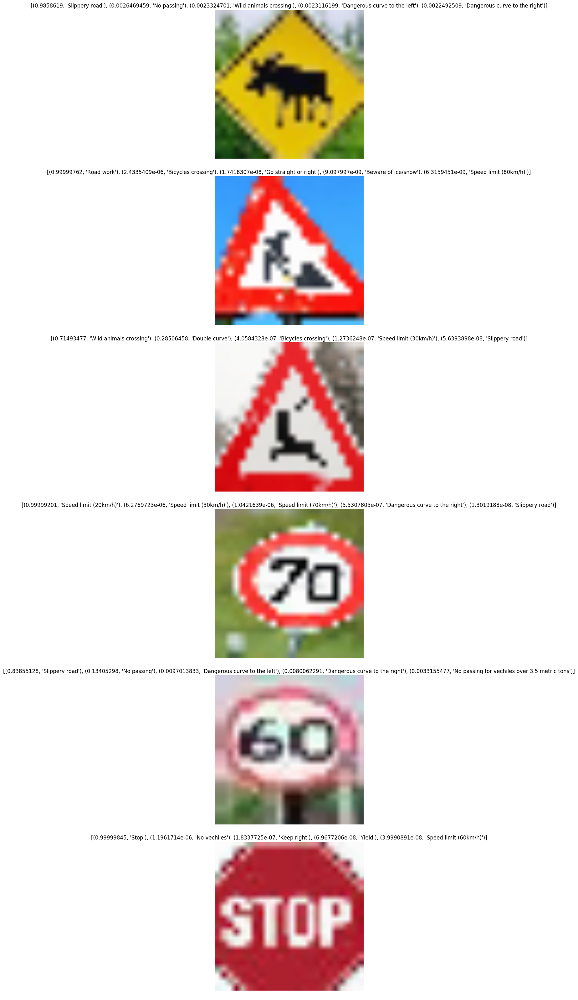

In [67]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
def get_all_probabilities_and_labels(top_k, index):
    scores = top_k[0][index].ravel()
    labels = top_k[1][index].ravel()    
    return [(scores[i], sign_names[x]) for i, x in enumerate(labels)]

    
# show all of the top 5 probabilities alongside the images.
_, ax = plt.subplots(6, 1, figsize=(32,32))
for i, image in enumerate(test_images):
    if i % 2 == 0 and i > 0:
        row_counter += 1
    ax[i].imshow(image)
    ax[i].grid(False)
    probabilities = get_all_probabilities_and_labels(top_k, i)
    
    ax[i].set_title('%s' % probabilities)
    ax[i].axis('off')
plt.tight_layout()


### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.11/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

For the two incorrect predictions, leaving out the unknown one, the correct prediction appears in the top 5 once, for the speed limit 60km/h it does not appear among the top 5.


**Answer:**

### Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._


**Answer:**

the images are part of the git repo and should load without problems. 

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.